# CVSN Assignment 6

- Sampad Kumar Kar
- MCS202215

In [21]:
import cv2

import numpy as np

import matplotlib.pyplot as plt

from skimage.util import random_noise

import os, time

In [3]:
def print_image(img, n_channels=3, isGray=False, title="Image"):
    '''
    Prints the image using `matplotlib`.

    - if isGray is False and n_channels=3, the image is colored, and is printed as it is
    - if isGray is True and n_channels = 3, the image is first converted to grayscale, and then printed as a black and white image
    - if isGray is True/False and n_channels = 1, the image is printed as a black and white image
    '''

    if n_channels == 1: # single channel image
        plt.figure(figsize=(5,5))
        plt.imshow(img, cmap='gray')
        plt.axis(False)
        plt.title(title)
        plt.show()
    else: # n_channels == 3; multi-channel image
        if isGray: # convert to grayscale
            img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            plt.figure(figsize=(5,5))
            plt.imshow(img_gray, cmap='gray')
            plt.axis(False)
            plt.title(title)
            plt.show()
        else: # colored image
            img_colored = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            plt.figure(figsize=(5,5))
            plt.imshow(img_colored)
            plt.axis(False)
            plt.title(title)
            plt.show()

# 1.

## 1.(a)

In [63]:
# checkerboard image save_path
checkerboard_save_path = os.path.join('data', 'Images', 'checkerboard.png')

checkerboard_img = cv2.imread(checkerboard_save_path, cv2.IMREAD_GRAYSCALE)

In [36]:
# Adding different types of noise to the image

# Gaussian noise
gaussian_noise_img = random_noise(checkerboard_img, mode='gaussian') * 255.0
gaussian_noise_img = gaussian_noise_img.astype(np.uint8)

# Salt and Pepper noise
salt_pepper_noise_img = random_noise(checkerboard_img, mode='s&p') * 255.0
salt_pepper_noise_img = salt_pepper_noise_img.astype(np.uint8)

# Function to add periodic noise to the the grayscaled image
def add_periodic_noise(img):
    '''
    Adds periodic noise to the image.

    Parameters:
    - img: the image to which the noise is to be added

    Returns:
    - noisy_img: the image with the added noise
    '''
    # get the dimensions of the image
    h,w = img.shape

    # create empty image to store the periodic noise
    noise = np.zeros((h,w), dtype=np.float64)

    # create a grid of x and y coordinates
    X, Y = np.meshgrid(np.arange(w), np.arange(h))

    # set amplitude and frequency of the noise
    A, ux, uy = 40, 45, 50
    noise += A * np.sin(X*ux + Y*uy)

    # repeat again with different amplitude and frequency
    A, ux, uy = -20, -45, 50
    noise += A * np.sin(X*ux + Y*uy)

    # add the noise to the image
    noisy_img = img + noise

    # clip the values to be in the range [0, 255]
    noisy_img = np.clip(noisy_img, 0, 255)
    noisy_img = noisy_img.astype(np.uint8)

    return noisy_img

# Periodic noise
periodic_noise_img = add_periodic_noise(checkerboard_img)

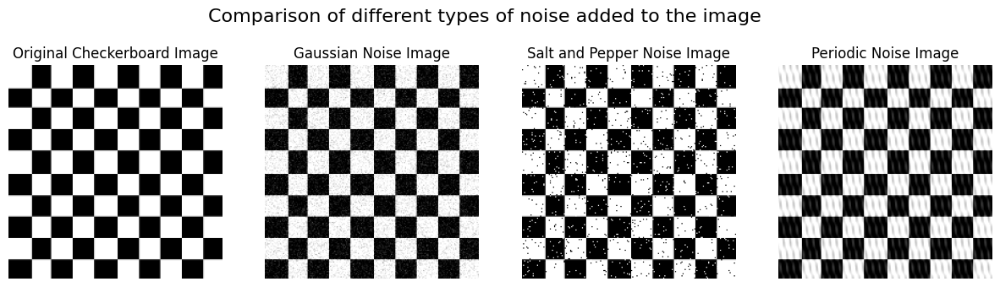

In [39]:
# plot side-by-side comparison
plt.figure(figsize=(15,4))
plt.suptitle("Comparison of different types of noise added to the image", fontsize=16)

# original checkerboard image
plt.subplot(1, 4, 1)
plt.imshow(checkerboard_img, cmap='gray')
plt.axis(False)
plt.title("Original Checkerboard Image")

# image after adding Gaussian noise
plt.subplot(1, 4, 2)
plt.imshow(gaussian_noise_img, cmap='gray')
plt.axis(False)
plt.title("Gaussian Noise Image")

# image after adding Salt and Pepper noise
plt.subplot(1, 4, 3)
plt.imshow(salt_pepper_noise_img, cmap='gray')
plt.axis(False)
plt.title("Salt and Pepper Noise Image")

# image after adding Periodic noise
plt.subplot(1, 4, 4)
plt.imshow(periodic_noise_img, cmap='gray')
plt.axis(False)
plt.title("Periodic Noise Image")

plt.show()

## 1.(b)

In [46]:
# Denoising the above images using different filters
# define functions to denoise the images

# Function to denoise the image using Gaussian filter
def denoise_gaussian(img, kernel_size=3):
    '''
    Denoises the grayscale image using Gaussian filter.

    Parameters:
    - img: the image to be denoised
    - kernel_size: the size of the kernel to be used for the Gaussian filter

    Returns:
    - denoised_img: the denoised image
    '''
    # create a Gaussian filter
    gaussian_filter = cv2.getGaussianKernel(kernel_size, 0)

    # apply the filter to the image
    denoised_img = cv2.sepFilter2D(img, -1, gaussian_filter, gaussian_filter)

    return denoised_img

# Function to denoise the image using Median filter
def denoise_median(img, kernel_size=3):
    '''
    Denoises the grayscale image using Median filter.

    Parameters:
    - img: the image to be denoised
    - kernel_size: the size of the kernel to be used for the Median filter

    Returns:
    - denoised_img: the denoised image
    '''
    # apply the filter to the image
    denoised_img = cv2.medianBlur(img, kernel_size)

    return denoised_img

# Function to denoise the image using Notch filter
def denoise_notch(img, kernel_size=3):
    '''
    Denoises the grayscale image using Notch filter.

    Parameters:
    - img: the image to be denoised
    - kernel_size: the size of the kernel to be used for the Notch filter

    Returns:
    - denoised_img: the denoised image
    '''
    # create a notch filter
    notch_filter = np.ones((kernel_size, kernel_size), dtype=np.float64)
    notch_filter[kernel_size//2, kernel_size//2] = -8

    # apply the filter to the image
    denoised_img = cv2.filter2D(img, -1, notch_filter)

    return denoised_img

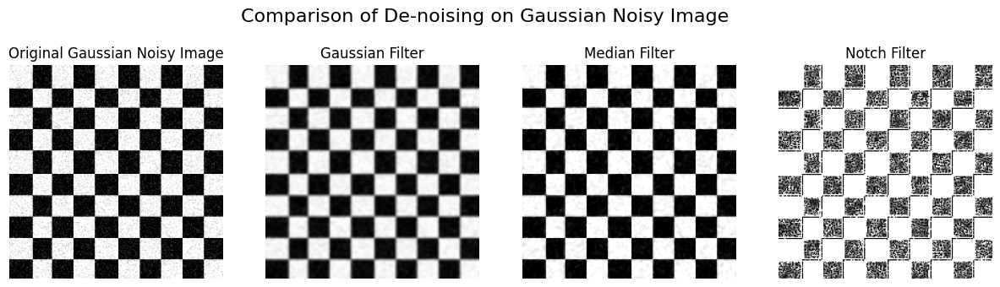

In [55]:
# denoising the gaussian noise image
gaussian_denoised_img = denoise_gaussian(gaussian_noise_img, kernel_size=5)
median_denosied_img = denoise_median(gaussian_noise_img, kernel_size=3)
notch_denoised_img = denoise_notch(gaussian_noise_img, kernel_size=4)

# plot side-by-side comparison
plt.figure(figsize=(15,4))
plt.suptitle("Comparison of De-noising on Gaussian Noisy Image", fontsize=16)

# original noisy image
plt.subplot(1, 4, 1)
plt.imshow(gaussian_noise_img, cmap='gray')
plt.axis(False)
plt.title("Original Gaussian Noisy Image")

# denoised image using Gaussian filter
plt.subplot(1, 4, 2)
plt.imshow(gaussian_denoised_img, cmap='gray')
plt.axis(False)
plt.title("Gaussian Filter")

# denoised image using Median filter
plt.subplot(1, 4, 3)
plt.imshow(median_denosied_img, cmap='gray')
plt.axis(False)
plt.title("Median Filter")

# denoised image using Notch filter
plt.subplot(1, 4, 4)
plt.imshow(notch_denoised_img, cmap='gray')
plt.axis(False)
plt.title("Notch Filter")

plt.show()

Here, **Gaussian Filter** seems to perform the best on **Gaussian Noisy** Image.

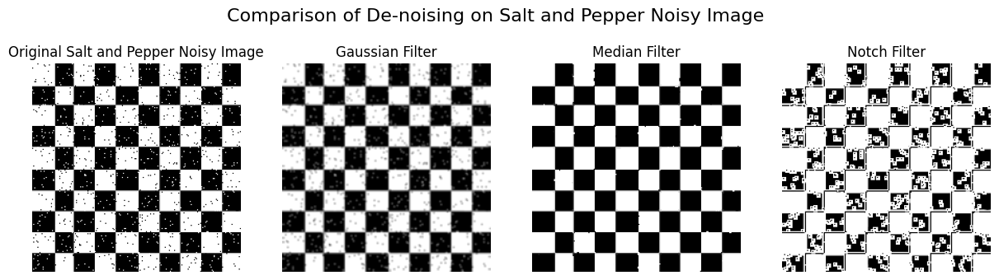

In [58]:
# denoising the salt and pepper noise image
gaussian_denoised_img = denoise_gaussian(salt_pepper_noise_img, kernel_size=3)
median_denosied_img = denoise_median(salt_pepper_noise_img, kernel_size=3)
notch_denoised_img = denoise_notch(salt_pepper_noise_img, kernel_size=4)

# plot side-by-side comparison
plt.figure(figsize=(15,4))
plt.suptitle("Comparison of De-noising on Salt and Pepper Noisy Image", fontsize=16)

# original noisy image
plt.subplot(1, 4, 1)
plt.imshow(salt_pepper_noise_img, cmap='gray')
plt.axis(False)
plt.title("Original Salt and Pepper Noisy Image")

# denoised image using Gaussian filter
plt.subplot(1, 4, 2)
plt.imshow(gaussian_denoised_img, cmap='gray')
plt.axis(False)
plt.title("Gaussian Filter")

# denoised image using Median filter
plt.subplot(1, 4, 3)
plt.imshow(median_denosied_img, cmap='gray')
plt.axis(False)
plt.title("Median Filter")

# denoised image using Notch filter
plt.subplot(1, 4, 4)
plt.imshow(notch_denoised_img, cmap='gray')
plt.axis(False)
plt.title("Notch Filter")

plt.show()

Here, **Median Filter** seems to perform the best on **Salt and Pepper** Noisy Image.

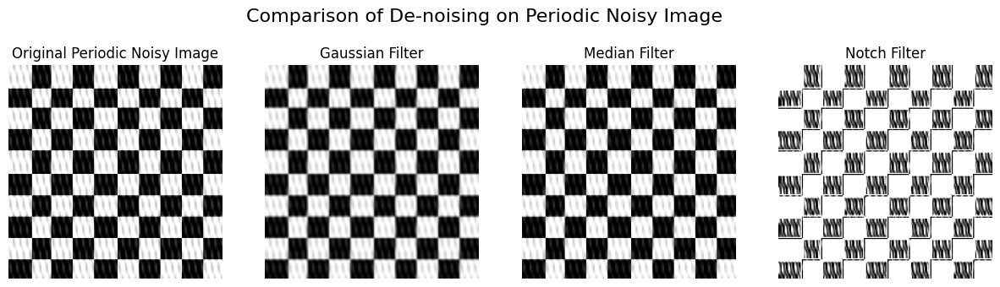

In [61]:
# denoising the periodic noise image
gaussian_denoised_img = denoise_gaussian(periodic_noise_img, kernel_size=3)
median_denosied_img = denoise_median(periodic_noise_img, kernel_size=3)
notch_denoised_img = denoise_notch(periodic_noise_img, kernel_size=4)

# plot side-by-side comparison
plt.figure(figsize=(15,4))
plt.suptitle("Comparison of De-noising on Periodic Noisy Image", fontsize=16)

# original noisy image
plt.subplot(1, 4, 1)
plt.imshow(periodic_noise_img, cmap='gray')
plt.axis(False)
plt.title("Original Periodic Noisy Image")

# denoised image using Gaussian filter
plt.subplot(1, 4, 2)
plt.imshow(gaussian_denoised_img, cmap='gray')
plt.axis(False)
plt.title("Gaussian Filter")

# denoised image using Median filter
plt.subplot(1, 4, 3)
plt.imshow(median_denosied_img, cmap='gray')
plt.axis(False)
plt.title("Median Filter")

# denoised image using Notch filter
plt.subplot(1, 4, 4)
plt.imshow(notch_denoised_img, cmap='gray')
plt.axis(False)
plt.title("Notch Filter")

plt.show()

Here, **Notch Filter** seems to perform the best on **Periodic** Noisy Image.

## 1.(c)

In [65]:
# notch image save_paths

# notch1
notch1_save_path = os.path.join('data', 'Images', 'notch1.jpg')
notch1_img = cv2.imread(notch1_save_path, cv2.IMREAD_GRAYSCALE)

# notch2
notch2_save_path = os.path.join('data', 'Images', 'notch2.png')
notch2_img = cv2.imread(notch2_save_path, cv2.IMREAD_GRAYSCALE)

# notch3
notch3_save_path = os.path.join('data', 'Images', 'notch3.jpg')
notch3_img = cv2.imread(notch3_save_path, cv2.IMREAD_GRAYSCALE)

In [66]:
# defining functions to apply ideal, Gaussian and Butterworth notch filters

# define function to get f-shift and save the dft
def get_fshift_dft_points(img):
    '''
    This function takes in an image and returns the f-shifted dft points of the image and the dft points of the image.

    Parameters:
    - img: The image to be converted to f-shifted dft points.

    Returns:
    - fshift: The f-shifted dft points of the image.
    '''
    # convert to numpy array
    img = np.asarray(img)

    # get the fourier transform of the image
    f = np.fft.fft2(img)

    # shift the zero-frequency component to the center of the spectrum
    fshift = np.fft.fftshift(f)

    # get the magnitude spectrum
    dft = 20*np.log(np.abs(fshift))

    # f-shifted dft 
    dft = cv2.dft(np.float32(img), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)

    # get the magnitude spectrum and phase spectrum of the f-shifted dft
    magnitude_spectrum, phase_spectrum = cv2.cartToPolar(dft_shift[:,:,0], dft_shift[:,:,1])

    # scale the magnitude spectrum
    magnitude_spectrum = 20*np.log(magnitude_spectrum+1)

    result = np.where(magnitude_spectrum == np.amax(magnitude_spectrum))
    result = magnitude_spectrum.argsort(axis=-1, kind=None, order=None)[-9:][::-1]

    # initialize the list of points
    points = []

    # get the 9 highest points
    for i in range(9):
        highest, high_index = -1, 0.1
        for ind_i, i in enumerate(magnitude_spectrum):
            for ind_j, j in enumerate(i):
                if j > highest and (ind_i, ind_j) not in points:
                    highest = j
                    high_index = (ind_i, ind_j)
        # append the highest point to the list of points
        points.append(high_index)

    # return the f-shifted dft points and the dft points
    return points[1:]


# define function to apply ideal notch filter
def ideal_notch_filter(img, d0=0.5):
    '''
    This function takes in an image and a cutoff frequency and returns the image after applying the ideal notch filter.

    Parameters:
    - img: The image to be filtered.
    - d0: The cutoff frequency.

    Returns:
    - img: The image after applying the ideal notch filter.
    '''
    # convert to numpy array
    img = np.asarray(img)

    # get the image dimensions
    h,w = img.shape

    # get the fourier transform of the image
    f = np.fft.fft2(img)

    # shift the zero-frequency component to the center of the spectrum
    fshift = np.fft.fftshift(f)

    # get the magnitude spectrum
    dft = 20*np.log(np.abs(fshift))

    # extract the f-shifted dft points
    points = get_fshift_dft_points(img)

    # apply the ideal notch filter
    for u in range(h):
        for v in range(w):
            for d in range(len(points)):
                u0, v0 = points[d]
                d1 = pow(u-u0, 2) + pow(v-v0, 2)
                d2 = pow(u+u0, 2) + pow(v+v0, 2)
                if d1 <= d0 or d2 <= d0:
                    fshift[u, v] *= 0.0
    
    # get the inverse fourier transform of the image
    f_ishift = np.fft.ifftshift(fshift)

    # get the inverse fourier transform of the image
    img_new = np.abs(np.fft.ifft2(f_ishift))

    return img_new

# define function to apply gaussian notch filter
def gaussian_notch_filter(img, d0=0.5):
    '''
    This function takes in an image and a cutoff frequency and returns the image after applying the gaussian notch filter.

    Parameters:
    - img: The image to be filtered.
    - d0: The cutoff frequency.

    Returns:
    - img: The image after applying the gaussian notch filter.
    '''
    # define a small value
    eps = 1e-5
    
    # convert to numpy array
    img = np.asarray(img)

    # get the image dimensions
    h,w = img.shape

    # get the fourier transform of the image
    f = np.fft.fft2(img)

    # shift the zero-frequency component to the center of the spectrum
    fshift = np.fft.fftshift(f)

    # get the magnitude spectrum
    dft = 20*np.log(np.abs(fshift))

    # extract the f-shifted dft points
    points = get_fshift_dft_points(img)

    # apply the gaussian notch filter
    for u in range(h):
        for v in range(w):
            for d in range(len(points)):
                u0, v0 = points[d]
                d1 = pow(u-u0, 2) + pow(v-v0, 2)
                d2 = pow(u+u0, 2) + pow(v+v0, 2)
                if d1 <= d0 or d2 <= d0:
                    fshift[u, v] *= (1.0 - np.exp(-0.5 * (d1 * d2) / (d0 * d0 + eps)))
    
    # get the inverse fourier transform of the image
    f_ishift = np.fft.ifftshift(fshift)

    # get the inverse fourier transform of the image
    img_new = np.abs(np.fft.ifft2(f_ishift))

    return img_new

# define function to apply butterworth notch filter
def butterworth_notch_filter(img, d0=0.5, n=1):
    '''
    This function takes in an image and a cutoff frequency and returns the image after applying the butterworth notch filter.

    Parameters:
    - img: The image to be filtered.
    - d0: The cutoff frequency.
    - n: The order of the filter.

    Returns:
    - img: The image after applying the butterworth notch filter.
    '''
    # define a small value
    eps = 1e-5

    # convert to numpy array
    img = np.asarray(img)

    # get the image dimensions
    h,w = img.shape

    # get the fourier transform of the image
    f = np.fft.fft2(img)

    # shift the zero-frequency component to the center of the spectrum
    fshift = np.fft.fftshift(f)

    # get the magnitude spectrum
    dft = 20*np.log(np.abs(fshift))

    # extract the f-shifted dft points
    points = get_fshift_dft_points(img)

    # apply the butterworth notch filter
    for u in range(h):
        for v in range(w):
            for d in range(len(points)):
                u0, v0 = points[d]
                d1 = pow(u-u0, 2) + pow(v-v0, 2)
                d2 = pow(u+u0, 2) + pow(v+v0, 2)
                if d1 <= d0 or d2 <= d0:
                    fshift[u, v] *= (1.0 / (1.0 + pow((d0 / np.sqrt(d1 * d2 + eps)), 2 * n)))
    
    # get the inverse fourier transform of the image
    f_ishift = np.fft.ifftshift(fshift)

    # get the inverse fourier transform of the image
    img_new = np.abs(np.fft.ifft2(f_ishift))

    return img_new

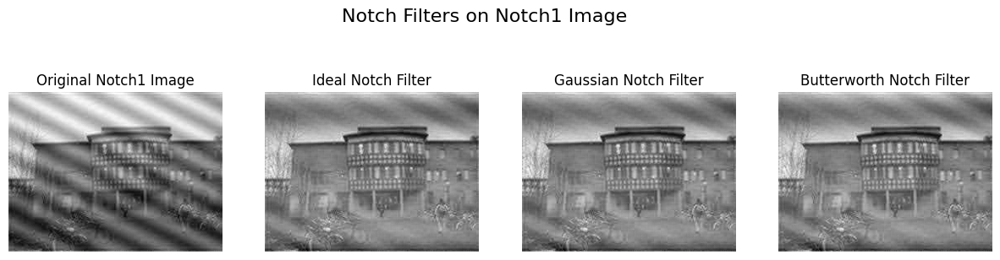

In [67]:
# apply the notch filters on notch1_img
notch1_img_ideal = ideal_notch_filter(notch1_img, d0=0.5)
notch1_img_gaussian = gaussian_notch_filter(notch1_img, d0=0.5)
notch1_img_butterworth = butterworth_notch_filter(notch1_img, d0=0.5, n=1)

# plot side-by-side comparison
plt.figure(figsize=(15, 4))
plt.suptitle('Notch Filters on Notch1 Image', fontsize=16)

# plot the original image
plt.subplot(1, 4, 1)
plt.imshow(notch1_img, cmap='gray')
plt.axis(False)
plt.title('Original Notch1 Image')

# plot the ideal notch filter
plt.subplot(1, 4, 2)
plt.imshow(notch1_img_ideal, cmap='gray')
plt.axis(False)
plt.title('Ideal Notch Filter')

# plot the gaussian notch filter
plt.subplot(1, 4, 3)
plt.imshow(notch1_img_gaussian, cmap='gray')
plt.axis(False)
plt.title('Gaussian Notch Filter')

# plot the butterworth notch filter
plt.subplot(1, 4, 4)
plt.imshow(notch1_img_butterworth, cmap='gray')
plt.axis(False)
plt.title('Butterworth Notch Filter')

plt.show()

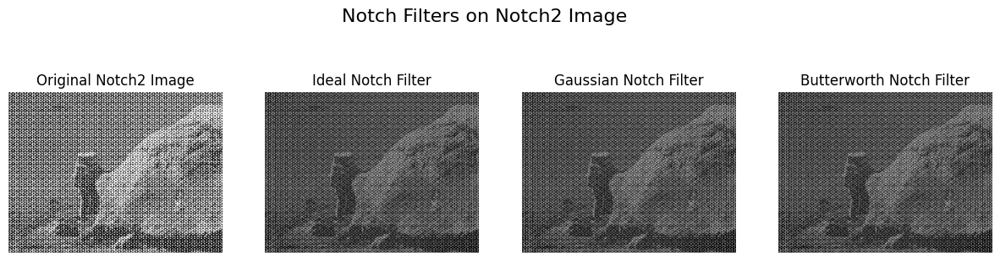

In [68]:
# apply the notch filters on notch2_img
notch2_img_ideal = ideal_notch_filter(notch2_img, d0=0.5)
notch2_img_gaussian = gaussian_notch_filter(notch2_img, d0=0.5)
notch2_img_butterworth = butterworth_notch_filter(notch2_img, d0=0.5, n=1)

# plot side-by-side comparison
plt.figure(figsize=(15, 4))
plt.suptitle('Notch Filters on Notch2 Image', fontsize=16)

# plot the original image
plt.subplot(1, 4, 1)
plt.imshow(notch2_img, cmap='gray')
plt.axis(False)
plt.title('Original Notch2 Image')

# plot the ideal notch filter
plt.subplot(1, 4, 2)
plt.imshow(notch2_img_ideal, cmap='gray')
plt.axis(False)
plt.title('Ideal Notch Filter')

# plot the gaussian notch filter
plt.subplot(1, 4, 3)
plt.imshow(notch2_img_gaussian, cmap='gray')
plt.axis(False)
plt.title('Gaussian Notch Filter')

# plot the butterworth notch filter
plt.subplot(1, 4, 4)
plt.imshow(notch2_img_butterworth, cmap='gray')
plt.axis(False)
plt.title('Butterworth Notch Filter')

plt.show()

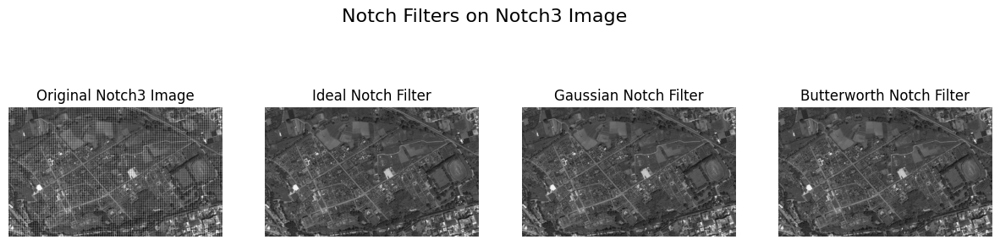

In [69]:
# apply the notch filters on notch3_img
notch3_img_ideal = ideal_notch_filter(notch3_img, d0=0.5)
notch3_img_gaussian = gaussian_notch_filter(notch3_img, d0=0.5)
notch3_img_butterworth = butterworth_notch_filter(notch3_img, d0=0.5, n=1)

# plot side-by-side comparison
plt.figure(figsize=(15, 4))
plt.suptitle('Notch Filters on Notch3 Image', fontsize=16)

# plot the original image
plt.subplot(1, 4, 1)
plt.imshow(notch3_img, cmap='gray')
plt.axis(False)
plt.title('Original Notch3 Image')

# plot the ideal notch filter
plt.subplot(1, 4, 2)
plt.imshow(notch3_img_ideal, cmap='gray')
plt.axis(False)
plt.title('Ideal Notch Filter')

# plot the gaussian notch filter
plt.subplot(1, 4, 3)
plt.imshow(notch3_img_gaussian, cmap='gray')
plt.axis(False)
plt.title('Gaussian Notch Filter')

# plot the butterworth notch filter
plt.subplot(1, 4, 4)
plt.imshow(notch3_img_butterworth, cmap='gray')
plt.axis(False)
plt.title('Butterworth Notch Filter')

plt.show()

# 2.

In [70]:
# image save paths

# fingerprint1
fingerprint1_save_path = os.path.join('data', 'Images', 'fingerprint1.jpg')
fingerprint1_img = cv2.imread(fingerprint1_save_path, cv2.IMREAD_GRAYSCALE)

# fingerprint2
fingerprint2_save_path = os.path.join('data', 'Images', 'fingerprint2.jpg')
fingerprint2_img = cv2.imread(fingerprint2_save_path, cv2.IMREAD_GRAYSCALE)

# bookpage
bookpage_save_path = os.path.join('data', 'Images', 'bookpage.jpg')
bookpage_img = cv2.imread(bookpage_save_path, cv2.IMREAD_GRAYSCALE)

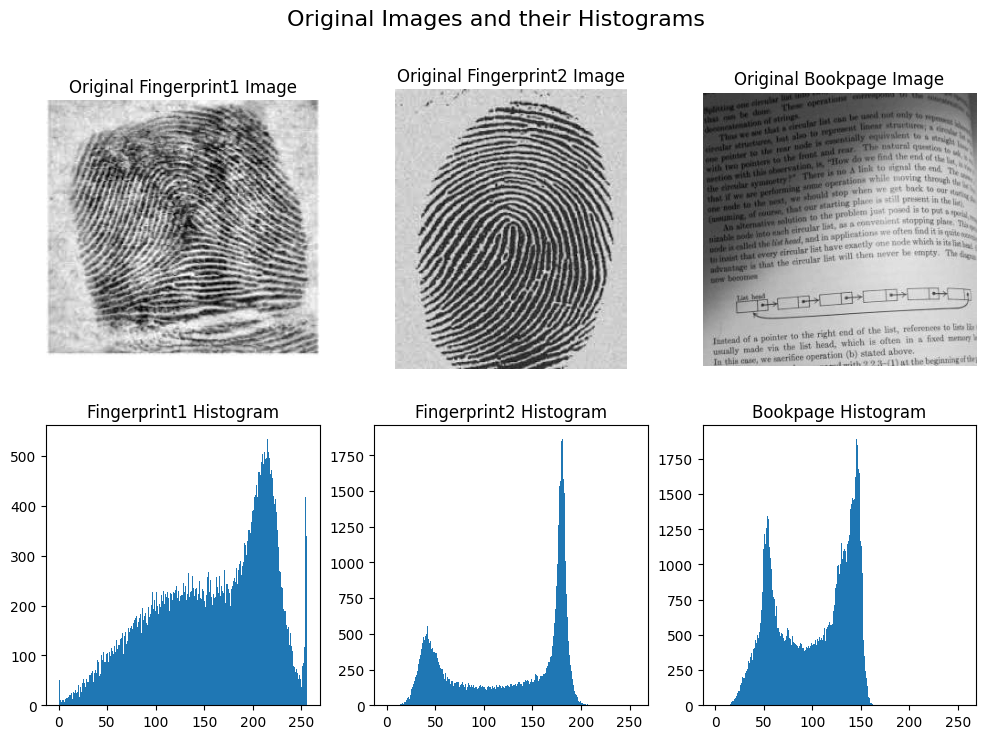

In [71]:
# plot side-by-side images and histograms
plt.figure(figsize=(12, 8))
plt.suptitle('Original Images and their Histograms', fontsize=16)

# plot the original images

plt.subplot(2, 3, 1)
plt.imshow(fingerprint1_img, cmap='gray')
plt.axis(False)
plt.title('Original Fingerprint1 Image')

plt.subplot(2, 3, 2)
plt.imshow(fingerprint2_img, cmap='gray')
plt.axis(False)
plt.title('Original Fingerprint2 Image')

plt.subplot(2, 3, 3)
plt.imshow(bookpage_img, cmap='gray')
plt.axis(False)
plt.title('Original Bookpage Image')

# plot their histograms

plt.subplot(2, 3, 4)
plt.hist(fingerprint1_img.ravel(), bins=256, range=(0, 256))
plt.title('Fingerprint1 Histogram')

plt.subplot(2, 3, 5)
plt.hist(fingerprint2_img.ravel(), bins=256, range=(0, 256))
plt.title('Fingerprint2 Histogram')

plt.subplot(2, 3, 6)
plt.hist(bookpage_img.ravel(), bins=256, range=(0, 256))
plt.title('Bookpage Histogram')

plt.show()

In [134]:
# thresholding the images using : manual thresholding, global thresholding, otsu's thresholding, adaptive thresholding (mean and gaussian)

# manual + global thresholding
def binary_thresholding(img, threshold=128):
    '''
    Manual/Global binary thresholding of a grayscale image.

    Parameters:
    - img: input grayscale image
    - threshold: threshold value

    Returns:
    - img_binary: binary image
    '''
    # convert the image to binary
    _, img_binary = cv2.threshold(img, threshold, 255, cv2.THRESH_BINARY)

    return img_binary

# otsu's thresholding
def otsu_thresholding(img, blur=False, kernel_size=None):
    '''
    Otsu's thresholding of a grayscale image.

    Parameters:
    - img: input grayscale image
    - blur: whether to apply gaussian blur before thresholding
    - kernel_size: kernel size for gaussian blur

    Returns:
    - img_binary: binary image
    '''
    if blur:
        img = cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)
    
    # convert type to uint8
    img = img.astype(np.uint8)
    
    # apply otsu's thresholding
    _, img_binary = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    return img_binary

# adaptive thresholding
def adaptive_thresholding(img, method='mean', blur=False, kernel_size=11, c=0):
    '''
    Adaptive thresholding of a grayscale image.

    Parameters:
    - img: input grayscale image
    - method: adaptive thresholding method (mean or gaussian)
    - blur: whether to apply gaussian blur before thresholding
    - kernel_size: kernel size for gaussian blur
    - c: constant subtracted from the mean or weighted mean

    Returns:
    - img_binary: binary image
    '''
    if blur:
        img = cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)
    
    # apply adaptive thresholding
    if method == 'mean':
        img_binary = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, kernel_size, c)
    elif method == 'gaussian':
        img_binary = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, kernel_size, c)

    return img_binary


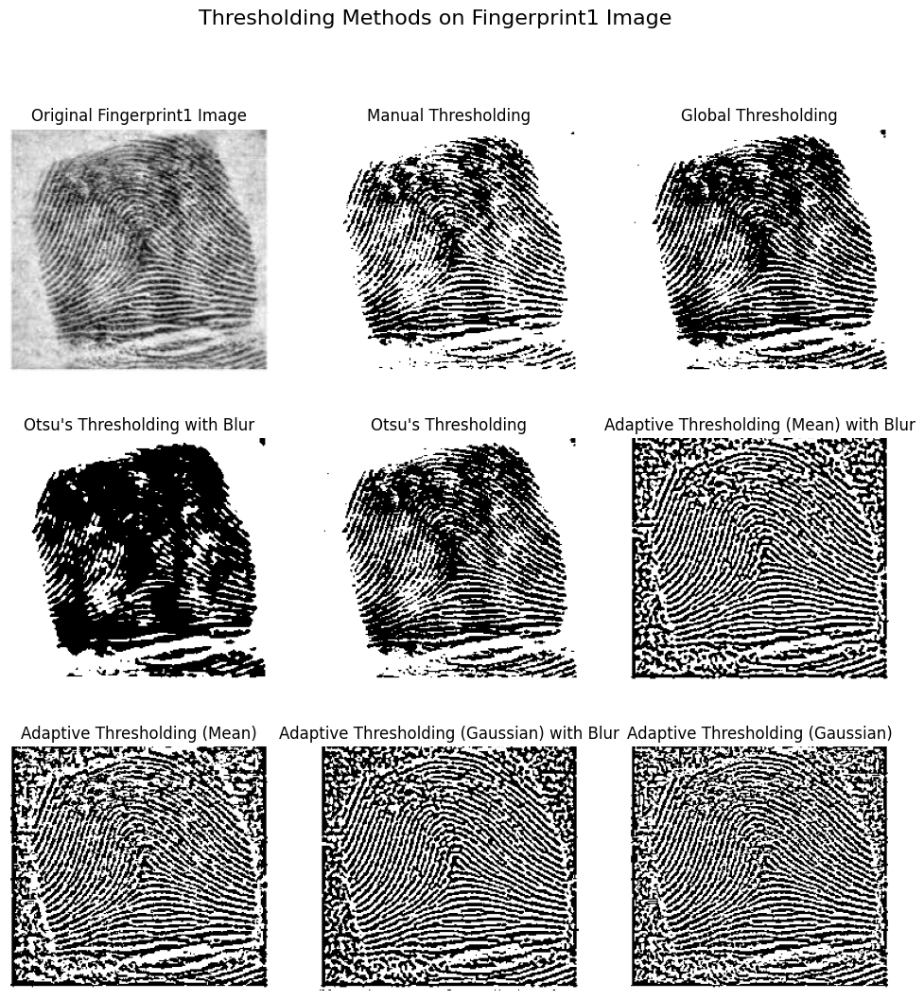

In [135]:
# comparing the thresholding methods on fingerprint1 image

# apply the thresholding methods on fingerprint1 image
fingerprint1_img_manual = binary_thresholding(fingerprint1_img, threshold=128)
fingerprint1_img_global = binary_thresholding(fingerprint1_img, threshold=150)
fingerprint1_img_otsu_blur = otsu_thresholding(fingerprint1_img, blur=True, kernel_size=5)
fingerprint1_img_otsu = otsu_thresholding(fingerprint1_img)
fingerprint1_img_adaptive_mean_blur = adaptive_thresholding(fingerprint1_img, method='mean', blur=True, kernel_size=5, c=0)
fingerprint1_img_adaptive_mean = adaptive_thresholding(fingerprint1_img, method='mean', c=0)
fingerprint1_img_adaptive_gaussian_blur = adaptive_thresholding(fingerprint1_img, method='gaussian', blur=True, kernel_size=5, c=0)
fingerprint1_img_adaptive_gaussian = adaptive_thresholding(fingerprint1_img, method='gaussian', c=0)

# plot the images side-by-side
plt.figure(figsize=(12, 12))
plt.suptitle('Thresholding Methods on Fingerprint1 Image', fontsize=16)

# plot the original image

plt.subplot(3, 3, 1)
plt.imshow(fingerprint1_img, cmap='gray')
plt.axis(False)
plt.title('Original Fingerprint1 Image')

# plot the thresholded images

plt.subplot(3, 3, 2)
plt.imshow(fingerprint1_img_manual, cmap='gray')
plt.axis(False)
plt.title('Manual Thresholding')

plt.subplot(3, 3, 3)
plt.imshow(fingerprint1_img_global, cmap='gray')
plt.axis(False)
plt.title('Global Thresholding')

plt.subplot(3, 3, 4)
plt.imshow(fingerprint1_img_otsu_blur, cmap='gray')
plt.axis(False)
plt.title("Otsu's Thresholding with Blur")

plt.subplot(3, 3, 5)
plt.imshow(fingerprint1_img_otsu, cmap='gray')
plt.axis(False)
plt.title("Otsu's Thresholding")

plt.subplot(3, 3, 6)
plt.imshow(fingerprint1_img_adaptive_mean_blur, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Mean) with Blur")

plt.subplot(3, 3, 7)
plt.imshow(fingerprint1_img_adaptive_mean, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Mean)")

plt.subplot(3, 3, 8)
plt.imshow(fingerprint1_img_adaptive_gaussian_blur, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Gaussian) with Blur")

plt.subplot(3, 3, 9)
plt.imshow(fingerprint1_img_adaptive_gaussian, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Gaussian)")

plt.show()

**Global Thresholding** and **Otsu's Thresholding** seems to perform the best on the `fingerprint1` image.

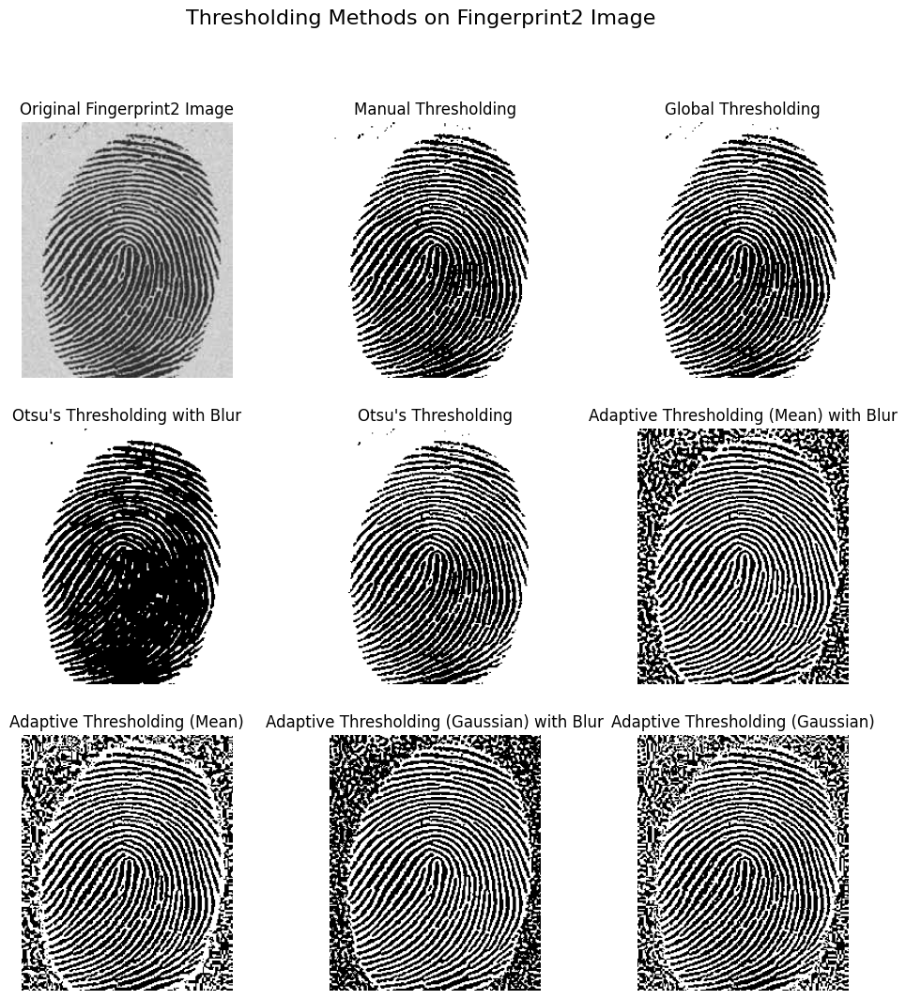

In [85]:
# comparing the thresholding methods on fingerprint2 image

# apply the thresholding methods on fingerprint2 image
fingerprint2_img_manual = binary_thresholding(fingerprint2_img, threshold=128)
fingerprint2_img_global = binary_thresholding(fingerprint2_img, threshold=120)
fingerprint2_img_otsu_blur = otsu_thresholding(fingerprint2_img, blur=True, kernel_size=5)
fingerprint2_img_otsu = otsu_thresholding(fingerprint2_img)
fingerprint2_img_adaptive_mean_blur = adaptive_thresholding(fingerprint2_img, method='mean', blur=True, kernel_size=5, c=0)
fingerprint2_img_adaptive_mean = adaptive_thresholding(fingerprint2_img, method='mean', c=0)
fingerprint2_img_adaptive_gaussian_blur = adaptive_thresholding(fingerprint2_img, method='gaussian', blur=True, kernel_size=5, c=0)
fingerprint2_img_adaptive_gaussian = adaptive_thresholding(fingerprint2_img, method='gaussian', c=0)

# plot the images side-by-side
plt.figure(figsize=(12, 12))
plt.suptitle('Thresholding Methods on Fingerprint2 Image', fontsize=16)

# plot the original image
plt.subplot(3, 3, 1)
plt.imshow(fingerprint2_img, cmap='gray')
plt.axis(False)
plt.title('Original Fingerprint2 Image')

# plot the thresholded images
plt.subplot(3, 3, 2)
plt.imshow(fingerprint2_img_manual, cmap='gray')
plt.axis(False)
plt.title('Manual Thresholding')

plt.subplot(3, 3, 3)
plt.imshow(fingerprint2_img_global, cmap='gray')
plt.axis(False)
plt.title('Global Thresholding')

plt.subplot(3, 3, 4)
plt.imshow(fingerprint2_img_otsu_blur, cmap='gray')
plt.axis(False)
plt.title("Otsu's Thresholding with Blur")

plt.subplot(3, 3, 5)
plt.imshow(fingerprint2_img_otsu, cmap='gray')
plt.axis(False)
plt.title("Otsu's Thresholding")

plt.subplot(3, 3, 6)
plt.imshow(fingerprint2_img_adaptive_mean_blur, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Mean) with Blur")

plt.subplot(3, 3, 7)
plt.imshow(fingerprint2_img_adaptive_mean, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Mean)")

plt.subplot(3, 3, 8)
plt.imshow(fingerprint2_img_adaptive_gaussian_blur, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Gaussian) with Blur")

plt.subplot(3, 3, 9)
plt.imshow(fingerprint2_img_adaptive_gaussian, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Gaussian)")

plt.show()

**Manual/Global Thresholding** and **Otsu's Thresholding** seems to perform the best on the `fingerprint2` image.

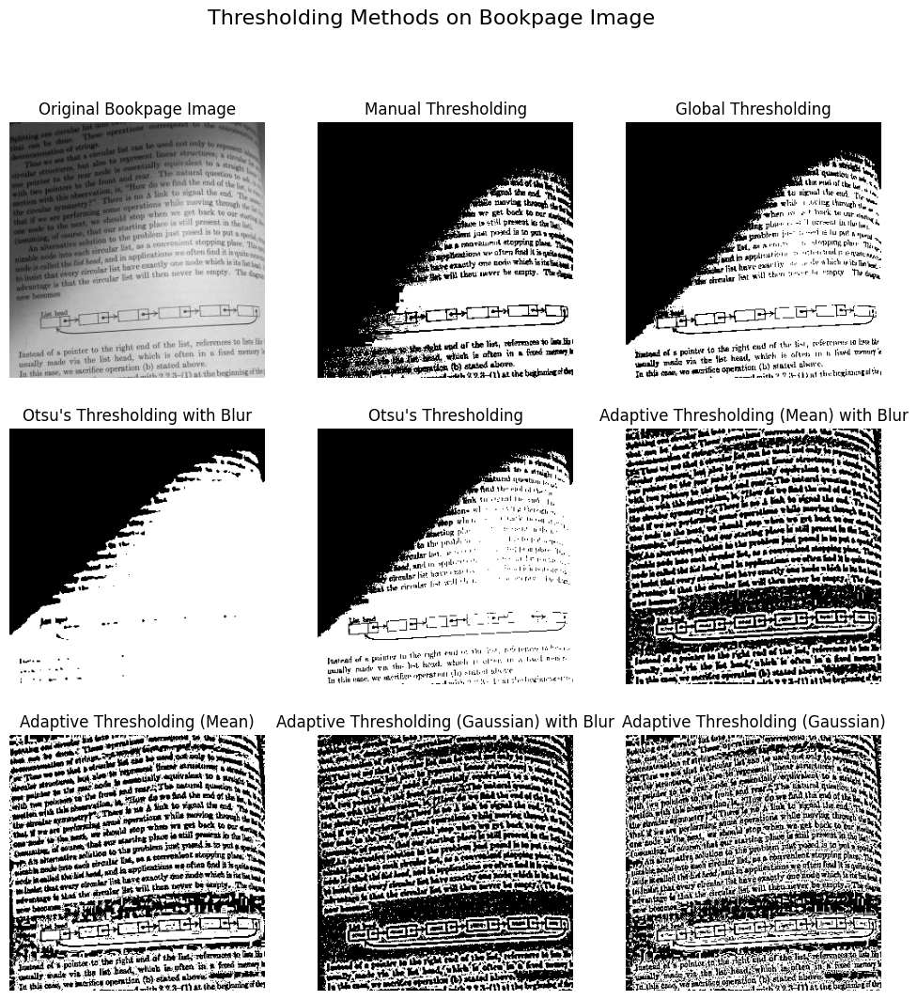

In [86]:
# comparing the thresholding methods on bookpage image

# apply the thresholding methods on bookpage image
bookpage_img_manual = binary_thresholding(bookpage_img, threshold=128)
bookpage_img_global = binary_thresholding(bookpage_img, threshold=110)
bookpage_img_otsu_blur = otsu_thresholding(bookpage_img, blur=True, kernel_size=5)
bookpage_img_otsu = otsu_thresholding(bookpage_img)
bookpage_img_adaptive_mean_blur = adaptive_thresholding(bookpage_img, method='mean', blur=True, kernel_size=5, c=0)
bookpage_img_adaptive_mean = adaptive_thresholding(bookpage_img, method='mean', c=0)
bookpage_img_adaptive_gaussian_blur = adaptive_thresholding(bookpage_img, method='gaussian', blur=True, kernel_size=5, c=0)
bookpage_img_adaptive_gaussian = adaptive_thresholding(bookpage_img, method='gaussian', c=0)

# plot the images side-by-side
plt.figure(figsize=(12, 12))
plt.suptitle('Thresholding Methods on Bookpage Image', fontsize=16)

# plot the original image
plt.subplot(3, 3, 1)
plt.imshow(bookpage_img, cmap='gray')
plt.axis(False)
plt.title('Original Bookpage Image')

# plot the thresholded images
plt.subplot(3, 3, 2)
plt.imshow(bookpage_img_manual, cmap='gray')
plt.axis(False)
plt.title('Manual Thresholding')

plt.subplot(3, 3, 3)
plt.imshow(bookpage_img_global, cmap='gray')
plt.axis(False)
plt.title('Global Thresholding')

plt.subplot(3, 3, 4)
plt.imshow(bookpage_img_otsu_blur, cmap='gray')
plt.axis(False)
plt.title("Otsu's Thresholding with Blur")

plt.subplot(3, 3, 5)
plt.imshow(bookpage_img_otsu, cmap='gray')
plt.axis(False)
plt.title("Otsu's Thresholding")

plt.subplot(3, 3, 6)
plt.imshow(bookpage_img_adaptive_mean_blur, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Mean) with Blur")

plt.subplot(3, 3, 7)
plt.imshow(bookpage_img_adaptive_mean, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Mean)")

plt.subplot(3, 3, 8)
plt.imshow(bookpage_img_adaptive_gaussian_blur, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Gaussian) with Blur")

plt.subplot(3, 3, 9)
plt.imshow(bookpage_img_adaptive_gaussian, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Gaussian)")

plt.show()

**Adaptive Thresholding** seems to perform the best on the `bookpage` image.

# 3.

In [88]:
# image save paths

# building
building_save_path = os.path.join('data', 'Images', 'building.jpg')
building_img = cv2.imread(building_save_path, cv2.IMREAD_GRAYSCALE)

# objetcs
objects_save_path = os.path.join('data', 'Images', 'objects.png')
objects_img = cv2.imread(objects_save_path, cv2.IMREAD_GRAYSCALE)

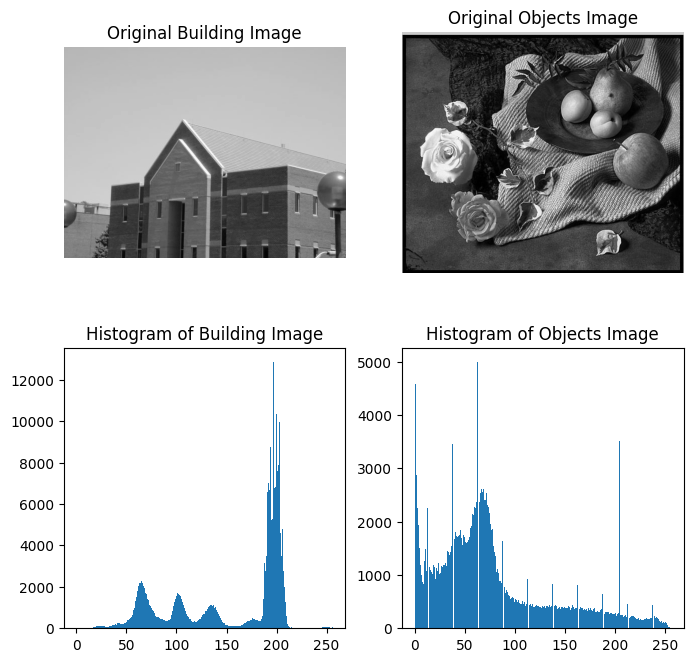

In [89]:
# plot side-by-side images and histograms
plt.figure(figsize=(8, 8))

# plot the original images

plt.subplot(2, 2, 1)
plt.imshow(building_img, cmap='gray')
plt.axis(False)
plt.title('Original Building Image')

plt.subplot(2, 2, 2)
plt.imshow(objects_img, cmap='gray')
plt.axis(False)
plt.title('Original Objects Image')

# plot their histograms

plt.subplot(2, 2, 3)
plt.hist(building_img.ravel(), bins=256, range=(0, 256))
plt.title('Histogram of Building Image')

plt.subplot(2, 2, 4)
plt.hist(objects_img.ravel(), bins=256, range=(0, 256))
plt.title('Histogram of Objects Image')

plt.show()

## 3.(a)

In [93]:
# Sobel kernel
def sobel_edge_detect(img, kernel_size=3):
    '''
    This function applies the sobel kernel to an image to detect edges.

    Parameters:
    - img: the image to be processed
    - kernel_size: the size of the sobel kernel

    Returns:
    - sobel: the image after applying the sobel kernel
    '''
    # apply gaussian smoothing
    img = cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)
    
    # calculate the x and y gradients using the sobel kernel
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=kernel_size)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=kernel_size)

    # calculate the gradient magnitude
    sobel = np.sqrt(sobelx**2 + sobely**2)

    # scale the sobel image to 0-255
    sobel = (sobel / np.max(sobel) * 255).astype(np.uint8)
    
    # return the sobel image
    return sobel

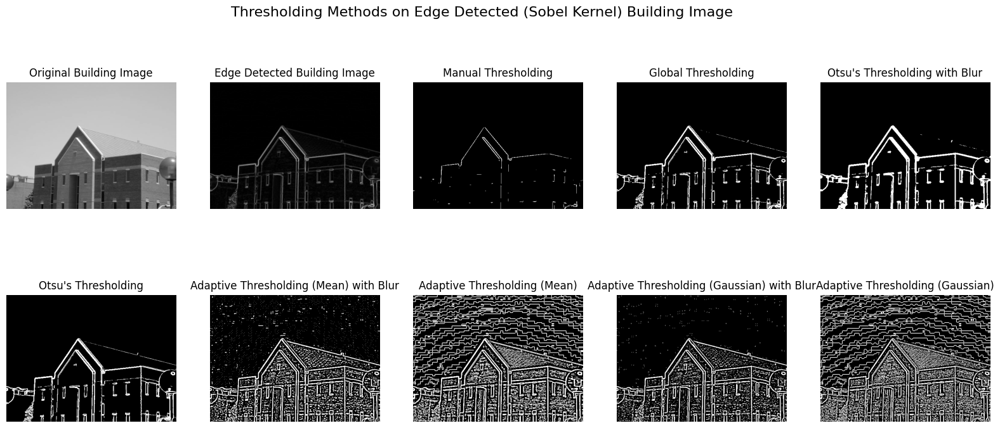

In [97]:
# edge detect and threshold the building image

# apply the sobel edge detection on the building image
building_img_sobel = sobel_edge_detect(building_img, kernel_size=3)

# apply the thresholding methods on the building image
building_img_manual = binary_thresholding(building_img_sobel, threshold=128)
building_img_global = binary_thresholding(building_img_sobel, threshold=50)
building_img_otsu_blur = otsu_thresholding(building_img_sobel, blur=True, kernel_size=5)
building_img_otsu = otsu_thresholding(building_img_sobel)
building_img_adaptive_mean_blur = adaptive_thresholding(building_img_sobel, method='mean', blur=True, kernel_size=5, c=0)
building_img_adaptive_mean = adaptive_thresholding(building_img_sobel, method='mean', c=0)
building_img_adaptive_gaussian_blur = adaptive_thresholding(building_img_sobel, method='gaussian', blur=True, kernel_size=5, c=0)
building_img_adaptive_gaussian = adaptive_thresholding(building_img_sobel, method='gaussian', c=0)

# plot the images side-by-side
plt.figure(figsize=(20, 8))
plt.suptitle('Thresholding Methods on Edge Detected (Sobel Kernel) Building Image', fontsize=16)

# plot the original image
plt.subplot(2, 5, 1)
plt.imshow(building_img, cmap='gray')
plt.axis(False)
plt.title('Original Building Image')

# plot edge detected image
plt.subplot(2, 5, 2)
plt.imshow(building_img_sobel, cmap='gray')
plt.axis(False)
plt.title('Edge Detected Building Image')

# plot the thresholded images
plt.subplot(2, 5, 3)
plt.imshow(building_img_manual, cmap='gray')
plt.axis(False)
plt.title('Manual Thresholding')

plt.subplot(2, 5, 4)
plt.imshow(building_img_global, cmap='gray')
plt.axis(False)
plt.title('Global Thresholding')

plt.subplot(2, 5, 5)
plt.imshow(building_img_otsu_blur, cmap='gray')
plt.axis(False)
plt.title("Otsu's Thresholding with Blur")

plt.subplot(2, 5, 6)
plt.imshow(building_img_otsu, cmap='gray')
plt.axis(False)
plt.title("Otsu's Thresholding")

plt.subplot(2, 5, 7)
plt.imshow(building_img_adaptive_mean_blur, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Mean) with Blur")

plt.subplot(2, 5, 8)
plt.imshow(building_img_adaptive_mean, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Mean)")

plt.subplot(2, 5, 9)
plt.imshow(building_img_adaptive_gaussian_blur, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Gaussian) with Blur")

plt.subplot(2, 5, 10)
plt.imshow(building_img_adaptive_gaussian, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Gaussian)")

plt.show()


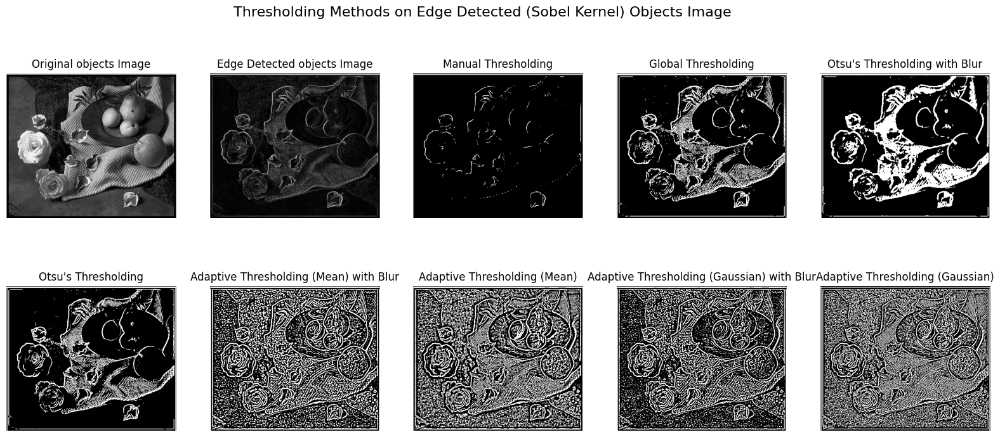

In [100]:
# edge detect and threshold the objects image

# apply the sobel edge detection on the objects image
objects_img_sobel = sobel_edge_detect(objects_img, kernel_size=3)

# apply the thresholding methods on the objects image
objects_img_manual = binary_thresholding(objects_img_sobel, threshold=128)
objects_img_global = binary_thresholding(objects_img_sobel, threshold=50)
objects_img_otsu_blur = otsu_thresholding(objects_img_sobel, blur=True, kernel_size=5)
objects_img_otsu = otsu_thresholding(objects_img_sobel)
objects_img_adaptive_mean_blur = adaptive_thresholding(objects_img_sobel, method='mean', blur=True, kernel_size=5, c=0)
objects_img_adaptive_mean = adaptive_thresholding(objects_img_sobel, method='mean', c=0)
objects_img_adaptive_gaussian_blur = adaptive_thresholding(objects_img_sobel, method='gaussian', blur=True, kernel_size=5, c=0)
objects_img_adaptive_gaussian = adaptive_thresholding(objects_img_sobel, method='gaussian', c=0)

# plot the images side-by-side
plt.figure(figsize=(20, 8))
plt.suptitle('Thresholding Methods on Edge Detected (Sobel Kernel) Objects Image', fontsize=16)

# plot the original image
plt.subplot(2, 5, 1)
plt.imshow(objects_img, cmap='gray')
plt.axis(False)
plt.title('Original objects Image')

# plot edge detected image
plt.subplot(2, 5, 2)
plt.imshow(objects_img_sobel, cmap='gray')
plt.axis(False)
plt.title('Edge Detected objects Image')

# plot the thresholded images
plt.subplot(2, 5, 3)
plt.imshow(objects_img_manual, cmap='gray')
plt.axis(False)
plt.title('Manual Thresholding')

plt.subplot(2, 5, 4)
plt.imshow(objects_img_global, cmap='gray')
plt.axis(False)
plt.title('Global Thresholding')

plt.subplot(2, 5, 5)
plt.imshow(objects_img_otsu_blur, cmap='gray')
plt.axis(False)
plt.title("Otsu's Thresholding with Blur")

plt.subplot(2, 5, 6)
plt.imshow(objects_img_otsu, cmap='gray')
plt.axis(False)
plt.title("Otsu's Thresholding")

plt.subplot(2, 5, 7)
plt.imshow(objects_img_adaptive_mean_blur, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Mean) with Blur")

plt.subplot(2, 5, 8)
plt.imshow(objects_img_adaptive_mean, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Mean)")

plt.subplot(2, 5, 9)
plt.imshow(objects_img_adaptive_gaussian_blur, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Gaussian) with Blur")

plt.subplot(2, 5, 10)
plt.imshow(objects_img_adaptive_gaussian, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Gaussian)")

plt.show()

## 3.(b)

In [103]:
# Laplacian of Gaussian - LoG (finding the zero crossings)
def LoG_edge_detect(img, kernel_size=3):
    '''
    This function applies the Laplacian of Gaussian kernel to an image to detect edges.

    Parameters:
    - img: the image to be processed
    - kernel_size: the size of the LoG kernel

    Returns:
    - LoG: the image after applying the LoG kernel
    '''
    # apply gaussian smoothing
    img = cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)
    
    # calculate the laplacian of gaussian
    LoG = cv2.Laplacian(img, cv2.CV_64F, ksize=kernel_size)
    
    # scale the log image to 0-255
    LoG = (LoG / np.max(LoG) * 255).astype(np.uint8)
    
    # return the log image
    return LoG

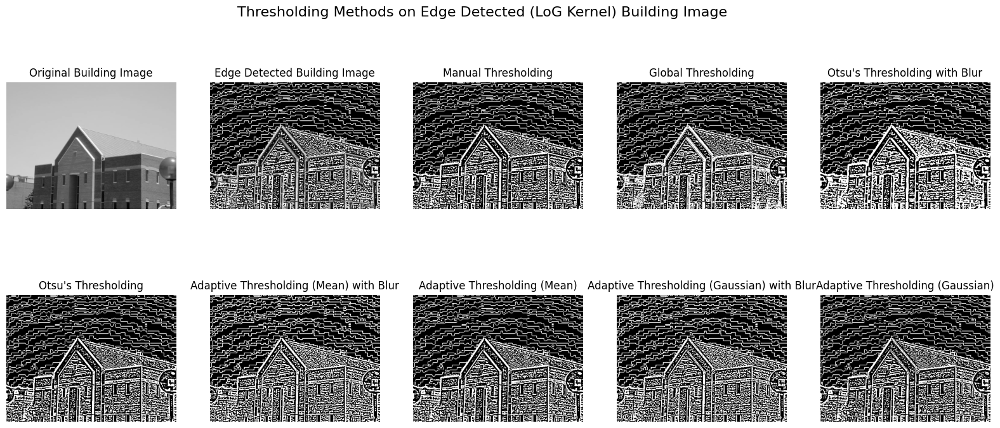

In [110]:
# edge detect and threshold the building image

# apply the LoG edge detection on the building image
building_img_LoG = LoG_edge_detect(building_img, kernel_size=5)

# apply the thresholding methods on the building image
building_img_manual = binary_thresholding(building_img_LoG, threshold=128)
building_img_global = binary_thresholding(building_img_LoG, threshold=50)
building_img_otsu_blur = otsu_thresholding(building_img_LoG, blur=True, kernel_size=5)
building_img_otsu = otsu_thresholding(building_img_LoG)
building_img_adaptive_mean_blur = adaptive_thresholding(building_img_LoG, method='mean', blur=True, kernel_size=5, c=0)
building_img_adaptive_mean = adaptive_thresholding(building_img_LoG, method='mean', c=0)
building_img_adaptive_gaussian_blur = adaptive_thresholding(building_img_LoG, method='gaussian', blur=True, kernel_size=5, c=0)
building_img_adaptive_gaussian = adaptive_thresholding(building_img_LoG, method='gaussian', c=0)

# plot the images side-by-side
plt.figure(figsize=(20, 8))
plt.suptitle('Thresholding Methods on Edge Detected (LoG Kernel) Building Image', fontsize=16)

# plot the original image
plt.subplot(2, 5, 1)
plt.imshow(building_img, cmap='gray')
plt.axis(False)
plt.title('Original Building Image')

# plot edge detected image
plt.subplot(2, 5, 2)
plt.imshow(building_img_LoG, cmap='gray')
plt.axis(False)
plt.title('Edge Detected Building Image')

# plot the thresholded images
plt.subplot(2, 5, 3)
plt.imshow(building_img_manual, cmap='gray')
plt.axis(False)
plt.title('Manual Thresholding')

plt.subplot(2, 5, 4)
plt.imshow(building_img_global, cmap='gray')
plt.axis(False)
plt.title('Global Thresholding')

plt.subplot(2, 5, 5)
plt.imshow(building_img_otsu_blur, cmap='gray')
plt.axis(False)
plt.title("Otsu's Thresholding with Blur")

plt.subplot(2, 5, 6)
plt.imshow(building_img_otsu, cmap='gray')
plt.axis(False)
plt.title("Otsu's Thresholding")

plt.subplot(2, 5, 7)
plt.imshow(building_img_adaptive_mean_blur, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Mean) with Blur")

plt.subplot(2, 5, 8)
plt.imshow(building_img_adaptive_mean, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Mean)")

plt.subplot(2, 5, 9)
plt.imshow(building_img_adaptive_gaussian_blur, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Gaussian) with Blur")

plt.subplot(2, 5, 10)
plt.imshow(building_img_adaptive_gaussian, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Gaussian)")

plt.show()

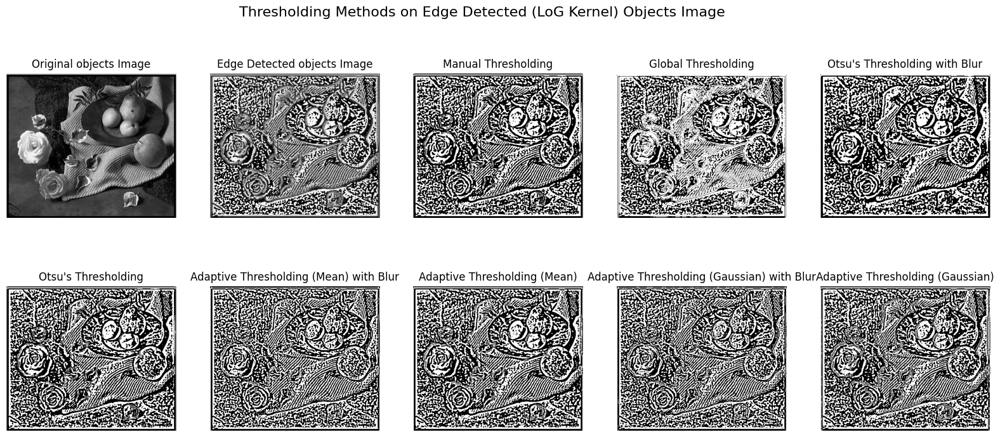

In [108]:
# edge detect and threshold the objects image

# apply the LoG edge detection on the objects image
objects_img_LoG = LoG_edge_detect(objects_img, kernel_size=7)

# apply the thresholding methods on the objects image
objects_img_manual = binary_thresholding(objects_img_LoG, threshold=128)
objects_img_global = binary_thresholding(objects_img_LoG, threshold=50)
objects_img_otsu_blur = otsu_thresholding(objects_img_LoG, blur=True, kernel_size=5)
objects_img_otsu = otsu_thresholding(objects_img_LoG)
objects_img_adaptive_mean_blur = adaptive_thresholding(objects_img_LoG, method='mean', blur=True, kernel_size=5, c=0)
objects_img_adaptive_mean = adaptive_thresholding(objects_img_LoG, method='mean', c=0)
objects_img_adaptive_gaussian_blur = adaptive_thresholding(objects_img_LoG, method='gaussian', blur=True, kernel_size=5, c=0)
objects_img_adaptive_gaussian = adaptive_thresholding(objects_img_LoG, method='gaussian', c=0)

# plot the images side-by-side
plt.figure(figsize=(20, 8))
plt.suptitle('Thresholding Methods on Edge Detected (LoG Kernel) Objects Image', fontsize=16)

# plot the original image
plt.subplot(2, 5, 1)
plt.imshow(objects_img, cmap='gray')
plt.axis(False)
plt.title('Original objects Image')

# plot edge detected image
plt.subplot(2, 5, 2)
plt.imshow(objects_img_LoG, cmap='gray')
plt.axis(False)
plt.title('Edge Detected objects Image')

# plot the thresholded images
plt.subplot(2, 5, 3)
plt.imshow(objects_img_manual, cmap='gray')
plt.axis(False)
plt.title('Manual Thresholding')

plt.subplot(2, 5, 4)
plt.imshow(objects_img_global, cmap='gray')
plt.axis(False)
plt.title('Global Thresholding')

plt.subplot(2, 5, 5)
plt.imshow(objects_img_otsu_blur, cmap='gray')
plt.axis(False)
plt.title("Otsu's Thresholding with Blur")

plt.subplot(2, 5, 6)
plt.imshow(objects_img_otsu, cmap='gray')
plt.axis(False)
plt.title("Otsu's Thresholding")

plt.subplot(2, 5, 7)
plt.imshow(objects_img_adaptive_mean_blur, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Mean) with Blur")

plt.subplot(2, 5, 8)
plt.imshow(objects_img_adaptive_mean, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Mean)")

plt.subplot(2, 5, 9)
plt.imshow(objects_img_adaptive_gaussian_blur, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Gaussian) with Blur")

plt.subplot(2, 5, 10)
plt.imshow(objects_img_adaptive_gaussian, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Gaussian)")

plt.show()

## 3.(c)

In [112]:
# Canny edge detector
def canny_edge_detect(img, kernel_size=3, low_threshold=100, high_threshold=200):
    '''
    This function applies the Canny edge detector to an image to detect edges.

    Parameters:
    - img: the image to be processed
    - kernel_size: the size of the gaussian kernel
    - low_threshold: the low threshold for the hysteresis procedure
    - high_threshold: the high threshold for the hysteresis procedure

    Returns:
    - canny: the image after applying the Canny edge detector
    '''
    # apply gaussian smoothing
    img = cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)
    
    # apply the canny edge detector
    canny = cv2.Canny(img, low_threshold, high_threshold)
    
    # return the canny image
    return canny

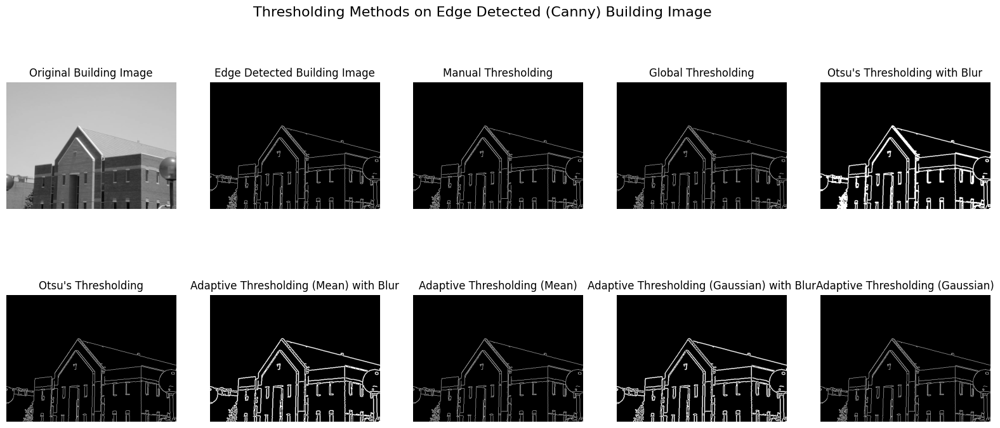

In [121]:
# edge detect and threshold the building image

# apply the Canny edge detection on the building image
building_img_canny = canny_edge_detect(building_img, kernel_size=3, low_threshold=50, high_threshold=100)

# apply the thresholding methods on the building image
building_img_manual = binary_thresholding(building_img_canny, threshold=128)
building_img_global = binary_thresholding(building_img_canny, threshold=50)
building_img_otsu_blur = otsu_thresholding(building_img_canny, blur=True, kernel_size=5)
building_img_otsu = otsu_thresholding(building_img_canny)
building_img_adaptive_mean_blur = adaptive_thresholding(building_img_canny, method='mean', blur=True, kernel_size=5, c=0)
building_img_adaptive_mean = adaptive_thresholding(building_img_canny, method='mean', c=0)
building_img_adaptive_gaussian_blur = adaptive_thresholding(building_img_canny, method='gaussian', blur=True, kernel_size=5, c=0)
building_img_adaptive_gaussian = adaptive_thresholding(building_img_canny, method='gaussian', c=0)

# plot the images side-by-side
plt.figure(figsize=(20, 8))
plt.suptitle('Thresholding Methods on Edge Detected (Canny) Building Image', fontsize=16)

# plot the original image
plt.subplot(2, 5, 1)
plt.imshow(building_img, cmap='gray')
plt.axis(False)
plt.title('Original Building Image')

# plot edge detected image
plt.subplot(2, 5, 2)
plt.imshow(building_img_canny, cmap='gray')
plt.axis(False)
plt.title('Edge Detected Building Image')

# plot the thresholded images
plt.subplot(2, 5, 3)
plt.imshow(building_img_manual, cmap='gray')
plt.axis(False)
plt.title('Manual Thresholding')

plt.subplot(2, 5, 4)
plt.imshow(building_img_global, cmap='gray')
plt.axis(False)
plt.title('Global Thresholding')

plt.subplot(2, 5, 5)
plt.imshow(building_img_otsu_blur, cmap='gray')
plt.axis(False)
plt.title("Otsu's Thresholding with Blur")

plt.subplot(2, 5, 6)
plt.imshow(building_img_otsu, cmap='gray')
plt.axis(False)
plt.title("Otsu's Thresholding")

plt.subplot(2, 5, 7)
plt.imshow(building_img_adaptive_mean_blur, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Mean) with Blur")

plt.subplot(2, 5, 8)
plt.imshow(building_img_adaptive_mean, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Mean)")

plt.subplot(2, 5, 9)
plt.imshow(building_img_adaptive_gaussian_blur, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Gaussian) with Blur")

plt.subplot(2, 5, 10)
plt.imshow(building_img_adaptive_gaussian, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Gaussian)")

plt.show()

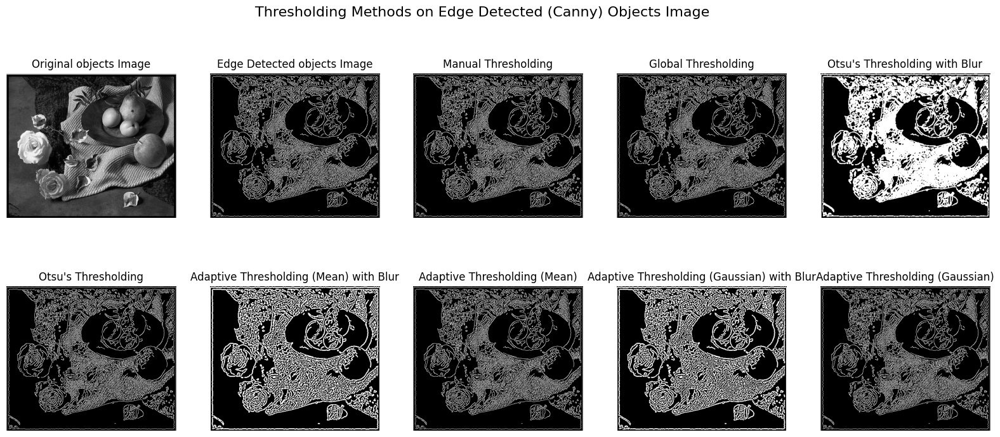

In [122]:
# edge detect and threshold the objects image

# apply the Canny edge detection on the objects image
objects_img_canny = canny_edge_detect(objects_img, kernel_size=3, low_threshold=50, high_threshold=100)

# apply the thresholding methods on the objects image
objects_img_manual = binary_thresholding(objects_img_canny, threshold=128)
objects_img_global = binary_thresholding(objects_img_canny, threshold=50)
objects_img_otsu_blur = otsu_thresholding(objects_img_canny, blur=True, kernel_size=5)
objects_img_otsu = otsu_thresholding(objects_img_canny)
objects_img_adaptive_mean_blur = adaptive_thresholding(objects_img_canny, method='mean', blur=True, kernel_size=5, c=0)
objects_img_adaptive_mean = adaptive_thresholding(objects_img_canny, method='mean', c=0)
objects_img_adaptive_gaussian_blur = adaptive_thresholding(objects_img_canny, method='gaussian', blur=True, kernel_size=5, c=0)
objects_img_adaptive_gaussian = adaptive_thresholding(objects_img_canny, method='gaussian', c=0)

# plot the images side-by-side
plt.figure(figsize=(20, 8))
plt.suptitle('Thresholding Methods on Edge Detected (Canny) Objects Image', fontsize=16)

# plot the original image
plt.subplot(2, 5, 1)
plt.imshow(objects_img, cmap='gray')
plt.axis(False)
plt.title('Original objects Image')

# plot edge detected image
plt.subplot(2, 5, 2)
plt.imshow(objects_img_canny, cmap='gray')
plt.axis(False)
plt.title('Edge Detected objects Image')

# plot the thresholded images
plt.subplot(2, 5, 3)
plt.imshow(objects_img_manual, cmap='gray')
plt.axis(False)
plt.title('Manual Thresholding')

plt.subplot(2, 5, 4)
plt.imshow(objects_img_global, cmap='gray')
plt.axis(False)
plt.title('Global Thresholding')

plt.subplot(2, 5, 5)
plt.imshow(objects_img_otsu_blur, cmap='gray')
plt.axis(False)
plt.title("Otsu's Thresholding with Blur")

plt.subplot(2, 5, 6)
plt.imshow(objects_img_otsu, cmap='gray')
plt.axis(False)
plt.title("Otsu's Thresholding")

plt.subplot(2, 5, 7)
plt.imshow(objects_img_adaptive_mean_blur, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Mean) with Blur")

plt.subplot(2, 5, 8)
plt.imshow(objects_img_adaptive_mean, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Mean)")

plt.subplot(2, 5, 9)
plt.imshow(objects_img_adaptive_gaussian_blur, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Gaussian) with Blur")

plt.subplot(2, 5, 10)
plt.imshow(objects_img_adaptive_gaussian, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Gaussian)")

plt.show()

## 3.(d)

In [125]:
# Hough transform
def hough_edge_detect(img, kernel_size=3, low_threshold=100, high_threshold=200, rho=1, theta=np.pi/180, threshold=15, min_line_length=10, max_line_gap=20):
    '''
    This function applies the Hough transform to an image to detect edges.

    Parameters:
    - img: the image to be processed
    - kernel_size: the size of the gaussian kernel
    - low_threshold: the low threshold for the hysteresis procedure
    - high_threshold: the high threshold for the hysteresis procedure
    - rho: the distance resolution of the accumulator in pixels
    - theta: the angular resolution of the accumulator in radians
    - threshold: the accumulator threshold parameter. Only those lines are returned that get enough votes (> threshold)
    - min_line_length: the minimum line length. Line segments shorter than that are rejected
    - max_line_gap: the maximum allowed gap between points on the same line to link them

    Returns:
    - hough: the image after applying the Hough transform
    '''
    # apply gaussian smoothing
    img = cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)
    
    # apply the canny edge detector
    canny = cv2.Canny(img, low_threshold, high_threshold)
    
    # apply the hough transform
    lines = cv2.HoughLinesP(canny, rho, theta, threshold, np.array([]), minLineLength=min_line_length, maxLineGap=max_line_gap)
    
    # create an image to draw the lines on
    hough = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    
    # draw the lines on the image
    for line in lines:
        for x1, y1, x2, y2 in line:
            cv2.line(hough, (x1, y1), (x2, y2), (255, 0, 0), 2)
    
    # return the hough image
    return hough

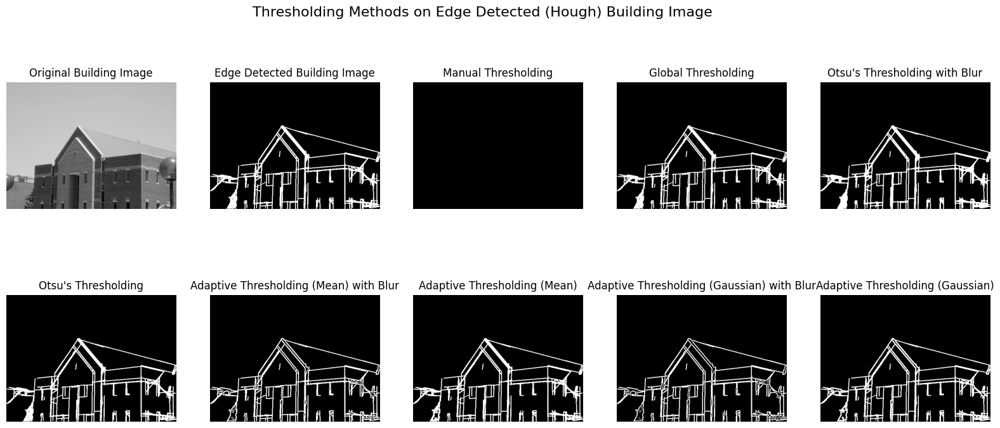

In [143]:
# edge detect and threshold the building image

# apply the Hough edge detection on the building image
building_img_hough = hough_edge_detect(building_img, kernel_size=3, low_threshold=50, high_threshold=100, rho=1, theta=np.pi/180, threshold=15, min_line_length=10, max_line_gap=20)

# convert the image to grayscale
building_img_hough = cv2.cvtColor(building_img_hough, cv2.COLOR_BGR2GRAY)

# apply the thresholding methods on the building image
building_img_manual = binary_thresholding(building_img_hough, threshold=128)
building_img_global = binary_thresholding(building_img_hough, threshold=25)
building_img_otsu_blur = otsu_thresholding(building_img_hough, blur=True, kernel_size=5)
building_img_otsu = otsu_thresholding(building_img_hough)
building_img_adaptive_mean_blur = adaptive_thresholding(building_img_hough, method='mean', blur=True, kernel_size=5, c=0)
building_img_adaptive_mean = adaptive_thresholding(building_img_hough, method='mean', c=0)
building_img_adaptive_gaussian_blur = adaptive_thresholding(building_img_hough, method='gaussian', blur=True, kernel_size=5, c=0)
building_img_adaptive_gaussian = adaptive_thresholding(building_img_hough, method='gaussian', c=0)

# plot the images side-by-side
plt.figure(figsize=(20, 8))
plt.suptitle('Thresholding Methods on Edge Detected (Hough) Building Image', fontsize=16)

# plot the original image
plt.subplot(2, 5, 1)
plt.imshow(building_img, cmap='gray')
plt.axis(False)
plt.title('Original Building Image')

# plot edge detected image
plt.subplot(2, 5, 2)
plt.imshow(building_img_hough, cmap='gray')
plt.axis(False)
plt.title('Edge Detected Building Image')

# plot the thresholded images
plt.subplot(2, 5, 3)
plt.imshow(building_img_manual, cmap='gray')
plt.axis(False)
plt.title('Manual Thresholding')

plt.subplot(2, 5, 4)
plt.imshow(building_img_global, cmap='gray')
plt.axis(False)
plt.title('Global Thresholding')

plt.subplot(2, 5, 5)
plt.imshow(building_img_otsu_blur, cmap='gray')
plt.axis(False)
plt.title("Otsu's Thresholding with Blur")

plt.subplot(2, 5, 6)
plt.imshow(building_img_otsu, cmap='gray')
plt.axis(False)
plt.title("Otsu's Thresholding")

plt.subplot(2, 5, 7)
plt.imshow(building_img_adaptive_mean_blur, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Mean) with Blur")

plt.subplot(2, 5, 8)
plt.imshow(building_img_adaptive_mean, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Mean)")

plt.subplot(2, 5, 9)
plt.imshow(building_img_adaptive_gaussian_blur, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Gaussian) with Blur")

plt.subplot(2, 5, 10)
plt.imshow(building_img_adaptive_gaussian, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Gaussian)")

plt.show()

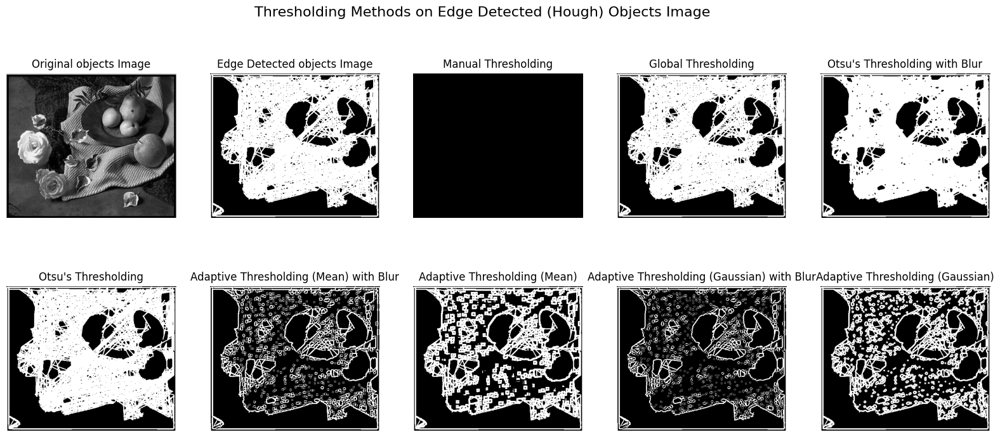

In [144]:
# edge detect and threshold the objects image

# apply the Hough edge detection on the objects image
objects_img_hough = hough_edge_detect(objects_img, kernel_size=3, low_threshold=50, high_threshold=100, rho=1, theta=np.pi/180, threshold=15, min_line_length=10, max_line_gap=20)

# convert the image to grayscale
objects_img_hough = cv2.cvtColor(objects_img_hough, cv2.COLOR_BGR2GRAY)

# apply the thresholding methods on the objects image
objects_img_manual = binary_thresholding(objects_img_hough, threshold=128)
objects_img_global = binary_thresholding(objects_img_hough, threshold=25)
objects_img_otsu_blur = otsu_thresholding(objects_img_hough, blur=True, kernel_size=5)
objects_img_otsu = otsu_thresholding(objects_img_hough)
objects_img_adaptive_mean_blur = adaptive_thresholding(objects_img_hough, method='mean', blur=True, kernel_size=5, c=0)
objects_img_adaptive_mean = adaptive_thresholding(objects_img_hough, method='mean', c=0)
objects_img_adaptive_gaussian_blur = adaptive_thresholding(objects_img_hough, method='gaussian', blur=True, kernel_size=5, c=0)
objects_img_adaptive_gaussian = adaptive_thresholding(objects_img_hough, method='gaussian', c=0)

# plot the images side-by-side
plt.figure(figsize=(20, 8))
plt.suptitle('Thresholding Methods on Edge Detected (Hough) Objects Image', fontsize=16)

# plot the original image
plt.subplot(2, 5, 1)
plt.imshow(objects_img, cmap='gray')
plt.axis(False)
plt.title('Original objects Image')

# plot edge detected image
plt.subplot(2, 5, 2)
plt.imshow(objects_img_hough, cmap='gray')
plt.axis(False)
plt.title('Edge Detected objects Image')

# plot the thresholded images
plt.subplot(2, 5, 3)
plt.imshow(objects_img_manual, cmap='gray')
plt.axis(False)
plt.title('Manual Thresholding')

plt.subplot(2, 5, 4)
plt.imshow(objects_img_global, cmap='gray')
plt.axis(False)
plt.title('Global Thresholding')

plt.subplot(2, 5, 5)
plt.imshow(objects_img_otsu_blur, cmap='gray')
plt.axis(False)
plt.title("Otsu's Thresholding with Blur")

plt.subplot(2, 5, 6)
plt.imshow(objects_img_otsu, cmap='gray')
plt.axis(False)
plt.title("Otsu's Thresholding")

plt.subplot(2, 5, 7)
plt.imshow(objects_img_adaptive_mean_blur, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Mean) with Blur")

plt.subplot(2, 5, 8)
plt.imshow(objects_img_adaptive_mean, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Mean)")

plt.subplot(2, 5, 9)
plt.imshow(objects_img_adaptive_gaussian_blur, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Gaussian) with Blur")

plt.subplot(2, 5, 10)
plt.imshow(objects_img_adaptive_gaussian, cmap='gray')
plt.axis(False)
plt.title("Adaptive Thresholding (Gaussian)")

plt.show()

Based on the observations above, we can conclude that **Canny Edge Detector** seems to perform the best on the `building` image. **Hough Transform** seems to be the best at detecting **straight lines** in the `building` image, while it struggles to detect the **curved lines** in the `objects` image.